# Python Project: SPX Prediction using Macro-Economic Indicators <br>

### - SPX Data Mining (factor=[SPX, DXY VIX, Mortgage, CPIAUCSL, USCCPI, USCPI, PPI, PMI, T10Y3M, T10Y2Y, TVC_US02Y, TVC_US10Y, UNRATE, USINTR, USIRMM, USIRYY, RETAILSMSA, INDPRO, USCCI])

#### *By Junseong Lee (Sophomore @ Gies College of Business, University of Illinois at Urbana Champaign; B.S. Finance & Data Science, Computer Science Minor)*

##### Objective:
- This project attempts to find a data series or macro-economic indicators which could be predictive of asset price movements and therefore actionable by investors.

- Assess potential relationships between S&P Price and Macro-economic indicators.

- Build and fit a model to the data of S&P500 and economic indicators.

- Interpretate the model and find a possible association between them.


***

## 0. Introduction to project

Economic indicators provide information about an economy and whether it is expanding or contracting. Most indicators are released monthly by government departments and agencies.

With the pressure of the Russo-Ukraine War and tension between the United States and China, the economy has been on a downward trend for the fiscal year of $2022$. The inflation index CPI has rose about 9.1% over the year 2022, which was the largest jump in $40$ years. The unemployment currently has been staying around $3.5$-$3.7$ percent, and the rate is expected to rise as of Dec. $2022$ as big tech companies began huge layoffs throughout the year; Tesla $29,999$ employees, Microsoft $21,731$ employees, Snap $21,332$ employees, Amazon $10,000$ employees, as well as Carvana, Oracle, Coinbase, Twitter, etc. <br>

For this personal project, I wanted to dive deeper into the relationship between economic numbers, such as **SPX (S&P 500 index)**, **UNRATE (unemployment rate)**, **CPI (the US consumer price index)**, and **TREASURY YIELD (refers to 10-year treasury constant maturity minus 3-month treasury constant maturity)**. Having said that, I will be using what I have learned from the STAT107 class and my previous knowledge in statistical analysis & stock market to examine these numeric values and seek to find potential correlations between the stock market movement and economic indicators. Majorly, I will be looking at the change in significant dates like 9/11, the 2008 subprime mortgage crisis, and the Covid-19 pandemic where the economy drastically fluctuated. 


< quick concepts > <br>
- S&P 500 
    - The Standard & Poor’s 500, often abbreviated as the S&P 500, is an American stock market index based on the market cpitalizations of 500 large companies having common stock listed on the NYSE or NASDAQ
    - Growth of the S&P 500 index can translate into growth of business investment. It can also be a clue to higher future consumer spending. A declining S&P 500 index can signal a tightening of belts for both businesses and consumers.
- CPI
    - A consumer price index (CPI) measures changes in the price level of a market basket of consumer goods and services purchased by households. Changes in CPI are used to assess price changes associated with the cost of living. CPI is one of the most frequently used statistics for identifying period of inflation or deflation. This is because large rises in CPI during a short period of time typically denote periods of inflation and large drops in CPI during a short period of time usually mark periods of deflation
- UNRATE
    - The percentage of unemployed workers in the total labor force
    - Unemployment can result in debt and poverty, and the government has to take care of these people, hence welfare spending would also increase at the same time. In cases where unemployment is very high, there would be a budget deficit, due to a combination of the two, loss of tax revenue and increased welfare spending.
- TREASURY YIELD
    - The 10-year Treasury yield is closely watched as an indicator of broader investor confidence. Because Treasury bills, notes, and bonds carry the full backing of the U.S. government, they are viewed as one of the safest investments.
    - When confidence is high, prices for the 10-year drop and yields rise. This is because investors feel they can find higher-returning investments elsewhere and do not feel they need to play it safe. But when confidence is low, bond prices rise and yields fall, as there is more demand for this safe investment. <br>

*source: investopedia, wikipedia, focus-economics.com*

#### ** Project data unit frequency = MONTHLY <--> index = 1998-2022 **

***
## 1.1 Raw Data Retrieval

In [387]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime
import os
import random
import statsmodels.api as sm

# ML library import
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [388]:
# ALL DATA RETRIEVED FROM TRADINGVIEW (1998-2022)
df_SPX = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/SPX_1m.csv')
df_DXY = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/DXY_1m.csv')
df_VIX = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/VIX_1m.csv')
df_mortgage = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/MORTGAGE30US_1m.csv')
df_CPIAUCSL = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/CPIAUCSL_1m.csv')
df_USCCPI = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USCCPI_1m.csv')
df_USCPI = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USCPI_1m.csv')
df_PPI = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/PPIACO_1m.csv')
df_PMI = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USCPMI_1m.csv')
df_T10Y3M = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/T10Y3M_1m.csv')
df_T10Y2Y = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/T10Y2Y_1m.csv')
df_TVC_US02Y = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/TVC_US02Y_1m.csv')
df_TVC_US10Y = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/TVC_US10Y_1m.csv')
df_UNRATE = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/UNRATE_1m.csv')
df_USINTR = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USINTR_1m.csv')
df_USIRMM = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USIRMM_1m.csv')
df_USIRYY = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USIRYY_1m.csv')
df_CCI = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/USCCI_1m.csv')
df_INDPRO = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/INDPRO_1m.csv')
df_RETAIL = pd.read_csv('/users/jun/Desktop/PythonProject/MacroEcon_Indicators/RETAILSMSA_1m.csv')

> Read read the data CSV files into the notebook to make sure the data loads correctly.

In [389]:
df_all= df_SPX.copy()
# add all closing index of macro indicators and create one cumulative dataframe
df_all['DXY'] = df_DXY['close']
df_all['VIX'] = df_VIX['close']
df_all['Mortgage'] = df_mortgage['close']
df_all['CPIAUCSL'] = df_CPIAUCSL['close']
df_all['USCCPI'] = df_USCCPI['close']
df_all['USCPI'] = df_USCPI['close']
df_all['PPI'] = df_PPI['close']
df_all['PMI'] = df_PMI['close']
df_all['T10Y3M'] = df_T10Y3M['close']
df_all['T10Y2Y'] = df_T10Y2Y['close']
df_all['TVC_US02Y'] = df_TVC_US02Y['close']
df_all['TVC_US10Y'] = df_TVC_US10Y['close']
df_all['UNRATE'] = df_UNRATE['close']
df_all['USINTR'] = df_USINTR['close']
df_all['USIRMM'] = df_USIRMM['close']
df_all['USIRYY'] = df_USIRYY['close']
df_all['INDPRO'] = df_INDPRO['close']
df_all['RETAIL'] = df_RETAIL['close']
df_all['CCI'] = df_CCI['close']
# get info
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 22 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   time       300 non-null    object 
 1   open       300 non-null    float64
 2   close      300 non-null    float64
 3   DXY        300 non-null    float64
 4   VIX        300 non-null    float64
 5   Mortgage   300 non-null    float64
 6   CPIAUCSL   297 non-null    float64
 7   USCCPI     298 non-null    float64
 8   USCPI      298 non-null    float64
 9   PPI        299 non-null    float64
 10  PMI        299 non-null    float64
 11  T10Y3M     300 non-null    float64
 12  T10Y2Y     300 non-null    float64
 13  TVC_US02Y  300 non-null    float64
 14  TVC_US10Y  300 non-null    float64
 15  UNRATE     299 non-null    float64
 16  USINTR     299 non-null    float64
 17  USIRMM     298 non-null    float64
 18  USIRYY     298 non-null    float64
 19  INDPRO     300 non-null    float64
 20  RETAIL    

> All index Dtype is float 64; however, time is not. We will need to convert time into numeric data.

In [390]:
df_all

,time,open,close,DXY,VIX,Mortgage,CPIAUCSL,USCCPI,USCPI,PPI,...,T10Y2Y,TVC_US02Y,TVC_US10Y,UNRATE,USINTR,USIRMM,USIRYY,INDPRO,RETAIL,CCI
0,1998-01-01T08:30:00-06:00,970.43,980.28,100.790,21.47,7.12,162.0,1.7,161.600,125.4,...,0.21,5.342,5.566,4.6,5.50,0.1,1.6,83.5919,208078000000,106.6
1,1998-02-02T08:30:00-06:00,980.28,1049.34,99.820,18.55,7.09,162.0,1.9,161.900,125.0,...,0.07,5.584,5.657,4.6,5.50,0.0,1.4,83.9696,208936000000,110.4
2,1998-03-02T08:30:00-06:00,1049.68,1101.75,101.500,24.22,7.08,162.2,1.7,162.200,124.7,...,0.07,5.634,5.712,4.7,5.50,0.0,1.4,84.3467,209363000000,106.5
3,1998-04-01T08:30:00-06:00,1101.75,1111.77,99.710,21.18,7.15,162.6,1.7,162.500,124.9,...,0.09,5.709,5.812,4.3,5.50,0.1,1.4,84.4865,209666000000,108.7
4,1998-05-01T08:30:00-05:00,1111.75,1090.82,100.450,21.32,7.07,162.8,1.7,162.800,125.1,...,0.03,5.550,5.571,4.4,5.50,0.2,1.7,84.5212,209552000000,106.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,2022-08-01T08:30:00-05:00,4112.38,3954.99,108.685,25.86,5.55,296.8,6.3,296.171,269.6,...,-0.30,3.495,3.196,3.7,2.50,0.1,8.3,104.0772,591793000000,58.2
296,2022-09-01T08:30:00-05:00,3936.73,3585.61,112.173,31.61,6.70,298.1,6.7,296.808,268.1,...,-0.39,4.283,3.833,3.5,3.25,0.4,8.2,104.7577,598145000000,58.6
297,2022-10-03T08:30:00-05:00,3609.78,3871.97,111.578,25.89,7.08,NaN,6.3,298.012,265.1,...,-0.41,4.487,4.052,3.7,3.25,0.4,7.7,104.6544,595894000000,59.9
298,2022-11-01T08:30:00-05:00,3901.79,4080.11,105.873,20.57,6.58,NaN,NaN,NaN,263.2,...,-0.70,4.314,3.611,3.7,4.00,NaN,NaN,104.8050,598380000000,56.8



## 1.2 Data Cleaning

> Null Check

In [391]:
df_all.dropna(inplace = True)

In [392]:
for col in df_all.columns:
    msg = 'column: {:>10}\t Percent of NaN value: {:.2f}%'.format(col, 100 * (df_all[col].isnull().sum() / df_all[col].shape[0]))
    print(msg)

column:       time	 Percent of NaN value: 0.00%
column:       open	 Percent of NaN value: 0.00%
column:      close	 Percent of NaN value: 0.00%
column:        DXY	 Percent of NaN value: 0.00%
column:        VIX	 Percent of NaN value: 0.00%
column:   Mortgage	 Percent of NaN value: 0.00%
column:   CPIAUCSL	 Percent of NaN value: 0.00%
column:     USCCPI	 Percent of NaN value: 0.00%
column:      USCPI	 Percent of NaN value: 0.00%
column:        PPI	 Percent of NaN value: 0.00%
column:        PMI	 Percent of NaN value: 0.00%
column:     T10Y3M	 Percent of NaN value: 0.00%
column:     T10Y2Y	 Percent of NaN value: 0.00%
column:  TVC_US02Y	 Percent of NaN value: 0.00%
column:  TVC_US10Y	 Percent of NaN value: 0.00%
column:     UNRATE	 Percent of NaN value: 0.00%
column:     USINTR	 Percent of NaN value: 0.00%
column:     USIRMM	 Percent of NaN value: 0.00%
column:     USIRYY	 Percent of NaN value: 0.00%
column:     INDPRO	 Percent of NaN value: 0.00%
column:     RETAIL	 Percent of NaN value

<AxesSubplot:>

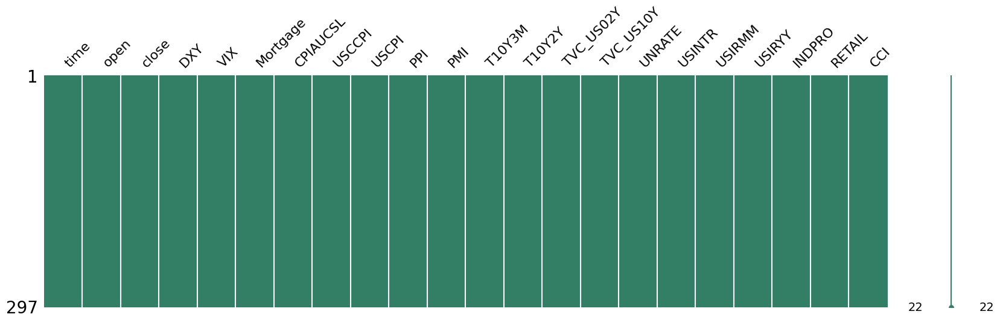

In [393]:
msno.matrix(df=df_all.iloc[:, :], figsize=(20,5), color=(0.2, 0.5, 0.4))

> Add percent change columns to each indicator dataframe and SPX.

In [394]:
# create function to apply to each dataframe
def add_percentChange(df, string): 
    df[string] = df['close'].pct_change()
    df.dropna(inplace = True)
    return df

In [395]:
add_percentChange(df_SPX,"SPX % Change")
add_percentChange(df_DXY,"DXY % Change")
add_percentChange(df_VIX,"VIX % Change")
add_percentChange(df_mortgage,"Mortgage % Change")
add_percentChange(df_CPIAUCSL,"CPIAUCSL % Change")
add_percentChange(df_USCCPI,"USCCPI % Change")
add_percentChange(df_USCPI,"USCPI % Change")
add_percentChange(df_PPI,"PPI % Change")
add_percentChange(df_PMI,"PMI % Change")
add_percentChange(df_T10Y3M,"T10Y3M % Change")
add_percentChange(df_T10Y2Y,"T10Y2Y % Change")
add_percentChange(df_UNRATE,"UNRATE % Change")
add_percentChange(df_USINTR,"USINTR % Change")
add_percentChange(df_USIRMM,"USIRMM % Change")
add_percentChange(df_USIRYY,"USIRYY % Change")
add_percentChange(df_INDPRO,"INDPRO % Change")
add_percentChange(df_RETAIL,"RETAIL % Change")
add_percentChange(df_CCI,"CCI % Change")

,time,open,high,low,close,CCI % Change
1,1998-01-31T18:00:00-06:00,110.4,110.4,110.4,110.4,0.035647
2,1998-02-28T18:00:00-06:00,106.5,106.5,106.5,106.5,-0.035326
3,1998-03-31T18:00:00-06:00,108.7,108.7,108.7,108.7,0.020657
4,1998-04-30T19:00:00-05:00,106.5,106.5,106.5,106.5,-0.020239
5,1998-05-31T19:00:00-05:00,105.6,105.6,105.6,105.6,-0.008451
...,...,...,...,...,...,...
295,2022-07-31T19:00:00-05:00,58.2,58.2,58.2,58.2,0.130097
296,2022-08-31T19:00:00-05:00,58.6,58.6,58.6,58.6,0.006873
297,2022-09-30T19:00:00-05:00,59.9,59.9,59.9,59.9,0.022184
298,2022-10-31T19:00:00-05:00,56.8,56.8,56.8,56.8,-0.051753


In [396]:
test = [10,20,30,40,50,60]
 
# Create the pandas DataFrame with column name is provided explicitly
dftest = pd.DataFrame(test, columns=['close'])
 
# print dataframe.
dftest

,close
0,10
1,20
2,30
3,40
4,50
5,60


In [397]:
add_percentChange(dftest, 'pct chg')

,close,pct chg
1,20,1.000000
2,30,0.500000
3,40,0.333333
4,50,0.250000
5,60,0.200000


> Create dataframe for percent change

In [398]:
add_percentChange(df_SPX,"SPX % Change")
add_percentChange(df_DXY,"DXY % Change")
add_percentChange(df_VIX,"VIX % Change")
add_percentChange(df_mortgage,"Mortgage % Change")
add_percentChange(df_CPIAUCSL,"CPIAUCSL % Change")
add_percentChange(df_USCCPI,"USCCPI % Change")
add_percentChange(df_USCPI,"USCPI % Change")
add_percentChange(df_PPI,"PPI % Change")
add_percentChange(df_PMI,"PMI % Change")
add_percentChange(df_T10Y3M,"T10Y3M % Change")
add_percentChange(df_T10Y2Y,"T10Y2Y % Change")
add_percentChange(df_UNRATE,"UNRATE % Change")
add_percentChange(df_USINTR,"USINTR % Change")
add_percentChange(df_USIRMM,"USIRMM % Change")
add_percentChange(df_USIRYY,"USIRYY % Change")
add_percentChange(df_INDPRO,"INDPRO % Change")
add_percentChange(df_RETAIL,"RETAIL % Change")
add_percentChange(df_CCI,"CCI % Change")

,time,open,high,low,close,CCI % Change
2,1998-02-28T18:00:00-06:00,106.5,106.5,106.5,106.5,-0.035326
3,1998-03-31T18:00:00-06:00,108.7,108.7,108.7,108.7,0.020657
4,1998-04-30T19:00:00-05:00,106.5,106.5,106.5,106.5,-0.020239
5,1998-05-31T19:00:00-05:00,105.6,105.6,105.6,105.6,-0.008451
6,1998-06-30T19:00:00-05:00,105.2,105.2,105.2,105.2,-0.003788
...,...,...,...,...,...,...
295,2022-07-31T19:00:00-05:00,58.2,58.2,58.2,58.2,0.130097
296,2022-08-31T19:00:00-05:00,58.6,58.6,58.6,58.6,0.006873
297,2022-09-30T19:00:00-05:00,59.9,59.9,59.9,59.9,0.022184
298,2022-10-31T19:00:00-05:00,56.8,56.8,56.8,56.8,-0.051753


In [399]:
percentage_data = pd.concat([df_SPX["SPX % Change"],df_DXY["DXY % Change"],df_VIX["VIX % Change"],df_mortgage["Mortgage % Change"],df_CPIAUCSL["CPIAUCSL % Change"],df_USCCPI["USCCPI % Change"],df_USCPI["USCPI % Change"],df_PPI["PPI % Change"],df_T10Y3M["T10Y3M % Change"],df_T10Y2Y["T10Y2Y % Change"],df_UNRATE["UNRATE % Change"],df_USINTR["USINTR % Change"],df_USIRMM["USIRMM % Change"],df_USIRYY["USIRYY % Change"],df_INDPRO["INDPRO % Change"],df_RETAIL["RETAIL % Change"],df_CCI["CCI % Change"]],axis=1)
percentage_data

,SPX % Change,DXY % Change,VIX % Change,Mortgage % Change,CPIAUCSL % Change,USCCPI % Change,USCPI % Change,PPI % Change,T10Y3M % Change,T10Y2Y % Change,UNRATE % Change,USINTR % Change,USIRMM % Change,USIRYY % Change,INDPRO % Change,RETAIL % Change,CCI % Change
2,0.049946,0.016830,0.305660,-0.001410,0.001235,-0.105263,0.001853,-0.002400,0.700000,0.000000,0.021739,0.000000,NaN,0.000000,0.004491,0.002044,-0.035326
3,0.009095,-0.017635,-0.125516,0.009887,0.002466,0.000000,0.001850,0.001604,0.333333,0.285714,-0.085106,0.000000,inf,0.000000,0.001657,0.001447,0.020657
4,-0.018844,0.007422,0.006610,-0.011189,0.001230,0.000000,0.001846,0.001601,-0.220588,-0.666667,0.023256,0.000000,1.0,0.214286,0.000411,-0.000544,-0.020239
5,0.039438,0.007168,-0.075516,-0.015559,0.002457,-0.058824,0.001229,-0.002398,-0.358491,-2.666667,0.022727,0.000000,-0.5,0.000000,0.003624,0.006108,-0.008451
6,-0.011615,0.000297,0.258245,0.001437,0.001225,0.000000,0.001227,0.000801,0.176471,-1.200000,0.000000,0.000000,1.0,0.000000,0.006273,0.013285,-0.003788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,-0.042442,0.026997,0.212946,0.047170,0.004060,0.050000,-0.000354,-0.009916,-0.269231,0.363636,0.057143,0.000000,inf,-0.023529,-0.000839,0.002635,0.130097
296,-0.093396,0.032093,0.222351,0.207207,0.004380,0.063492,0.002151,-0.005564,1.631579,0.300000,-0.054054,0.300000,3.0,-0.012048,0.006538,0.010733,0.006873
297,0.079864,-0.005304,-0.180955,0.056716,NaN,-0.059701,0.004056,-0.011190,-1.240000,0.051282,0.057143,0.000000,0.0,-0.060976,-0.000986,-0.003763,0.022184
298,0.053756,-0.051130,-0.205485,-0.070621,NaN,NaN,NaN,-0.007167,4.750000,0.707317,0.000000,0.230769,NaN,NaN,0.001439,0.004172,-0.051753


***
## 2. Exploratory Analysis (Data Visualization and Data Mining)

In [400]:
# Checking Columns
print(df_all.columns.values)

['time' 'open' 'close' 'DXY' 'VIX' 'Mortgage' 'CPIAUCSL' 'USCCPI' 'USCPI'
 'PPI' 'PMI' 'T10Y3M' 'T10Y2Y' 'TVC_US02Y' 'TVC_US10Y' 'UNRATE' 'USINTR'
 'USIRMM' 'USIRYY' 'INDPRO' 'RETAIL' 'CCI']


> Create a list of significant dates (911, Subprime Mortgage Crisis, Covid-19 Pandemic)

In [401]:
# The (likely) coronavirus recession. ...
# The Great Recession (December 2007 to June 2009) ...
# Dot-com recession (March 2001 to November 2001) ...
# Gulf War recession (July 1990 to March 1991) ...
# Energy crisis recession (July 1981 to November 1982)
xposition = [pd.to_datetime('2007-08-01'), pd.to_datetime('2009-04-01'), pd.to_datetime('2014-02-01'), pd.to_datetime('2018-01-01'), pd.to_datetime('2020-03-01')]

> Modify Datetime Array to Float

In [402]:
# option 1 - to datetime
df_all['time'] = pd.to_datetime(df_all['time'], infer_datetime_format=True)

In [403]:
# option 2 - to integer
def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day

time = []
for i in df_all['time']:
    t = to_integer(i) # datetime.strptime(i, '%m/%d/%y')
    d = {'DATE': t}
    time.append(d)
df = pd.DataFrame(time)
df

,DATE
0,19980101
1,19980202
2,19980302
3,19980401
4,19980501
...,...
292,20220502
293,20220601
294,20220701
295,20220801


> Use concatenation to build a variable - data

In [404]:
data = pd.concat([df_all[['open', 'close', 'DXY', 'VIX', 'Mortgage', 'CPIAUCSL', 'USCCPI', 'USCPI',
 'PPI', 'PMI', 'T10Y3M', 'T10Y2Y', 'TVC_US02Y', 'TVC_US10Y', 'UNRATE', 'USINTR',
 'USIRMM', 'USIRYY', 'INDPRO', 'RETAIL', 'CCI']]],axis = 1)
data.columns = ['open', 'close', 'DXY', 'VIX', 'Mortgage', 'CPIAUCSL', 'USCCPI', 'USCPI',
 'PPI', 'PMI', 'T10Y3M', 'T10Y2Y', 'TVC_US02Y', 'TVC_US10Y', 'UNRATE', 'USINTR',
 'USIRMM', 'USIRYY', 'INDPRO', 'RETAIL', 'CCI']
data

,open,close,DXY,VIX,Mortgage,CPIAUCSL,USCCPI,USCPI,PPI,PMI,...,T10Y2Y,TVC_US02Y,TVC_US10Y,UNRATE,USINTR,USIRMM,USIRYY,INDPRO,RETAIL,CCI
0,970.43,980.280,100.790,21.47,7.12,162.0,1.700,161.600,125.4,60.3,...,0.21,5.342,5.566,4.6,5.50,0.1,1.6,83.5919,208078000000,106.6
1,980.28,1049.340,99.820,18.55,7.09,162.0,1.900,161.900,125.0,58.1,...,0.07,5.584,5.657,4.6,5.50,0.0,1.4,83.9696,208936000000,110.4
2,1049.68,1101.750,101.500,24.22,7.08,162.2,1.700,162.200,124.7,58.1,...,0.07,5.634,5.712,4.7,5.50,0.0,1.4,84.3467,209363000000,106.5
3,1101.75,1111.770,99.710,21.18,7.15,162.6,1.700,162.500,124.9,57.4,...,0.09,5.709,5.812,4.3,5.50,0.1,1.4,84.4865,209666000000,108.7
4,1111.75,1090.820,100.450,21.32,7.07,162.8,1.700,162.800,125.1,56.5,...,0.03,5.550,5.571,4.4,5.50,0.2,1.7,84.5212,209552000000,106.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,4130.61,4132.160,101.782,26.18,5.10,295.3,5.761,292.296,273.3,60.3,...,0.32,2.563,2.848,3.6,1.00,1.0,8.6,103.5717,581768000000,58.4
293,4149.78,3785.390,104.738,28.70,5.70,295.3,6.078,296.311,280.3,56.0,...,0.06,2.957,3.017,3.6,1.75,1.3,9.1,104.2709,587570000000,50.0
294,3781.00,4130.289,105.828,21.32,5.30,295.6,6.000,296.276,272.3,52.1,...,-0.22,2.888,2.654,3.5,2.50,0.0,8.5,104.1646,590238000000,51.5
295,4112.38,3954.990,108.685,25.86,5.55,296.8,6.300,296.171,269.6,52.2,...,-0.30,3.495,3.196,3.7,2.50,0.1,8.3,104.0772,591793000000,58.2


> Correlation Maxtix Heatmap
- I have created a Pearson Correlation heatmap to identify the potential relationship between each indicator. The map is shown below:

- correlation matrix (heatmap) indicates there is somewhat a correlation between 10yr treasury yield and unemployment rate --> Graph a dual axis plot for data series.

In [405]:
from  matplotlib.colors import LinearSegmentedColormap
def createHeatmap(dataframe, size):
    # create size
    plt.figure(figsize = (size,size))
    
    # create custom colormap
    c = ["darkred","red","lightcoral","white", "palegreen","green","darkgreen"]
    v = [0,.15,.4,.5,0.6,.9,1.]
    l = list(zip(v,c))
    colormap=LinearSegmentedColormap.from_list('rg',l, N=256)
    sns.heatmap(dataframe.astype(float).corr(), cmap=colormap, annot=True)
    plt.show()

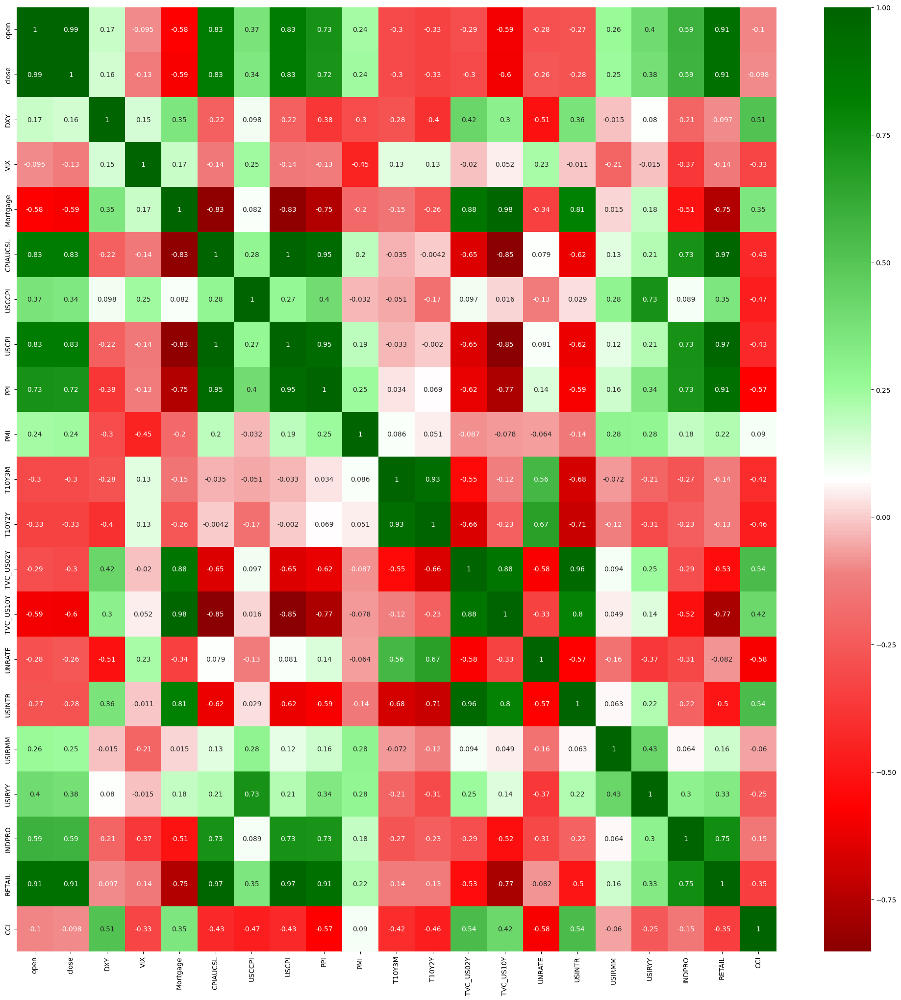

In [406]:
createHeatmap(data,25)

<AxesSubplot:>

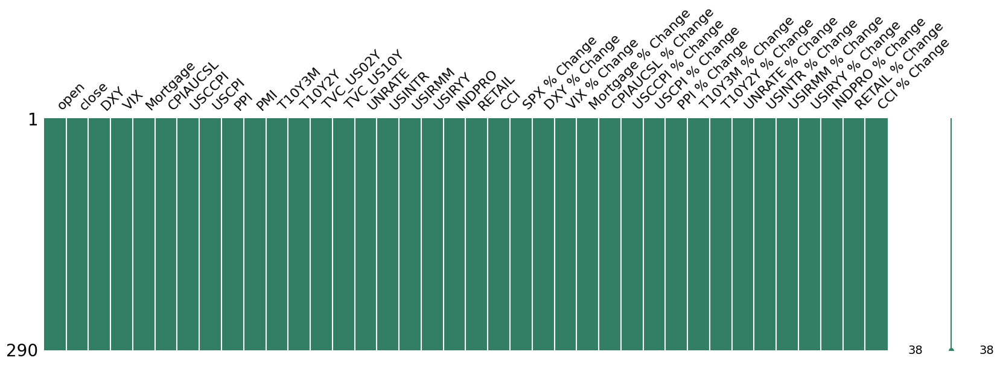

In [407]:
whole = pd.concat([data, percentage_data], axis=1)
whole.dropna(inplace=True)
msno.matrix(df=whole.iloc[:, :], figsize=(20,5), color=(0.2, 0.5, 0.4))

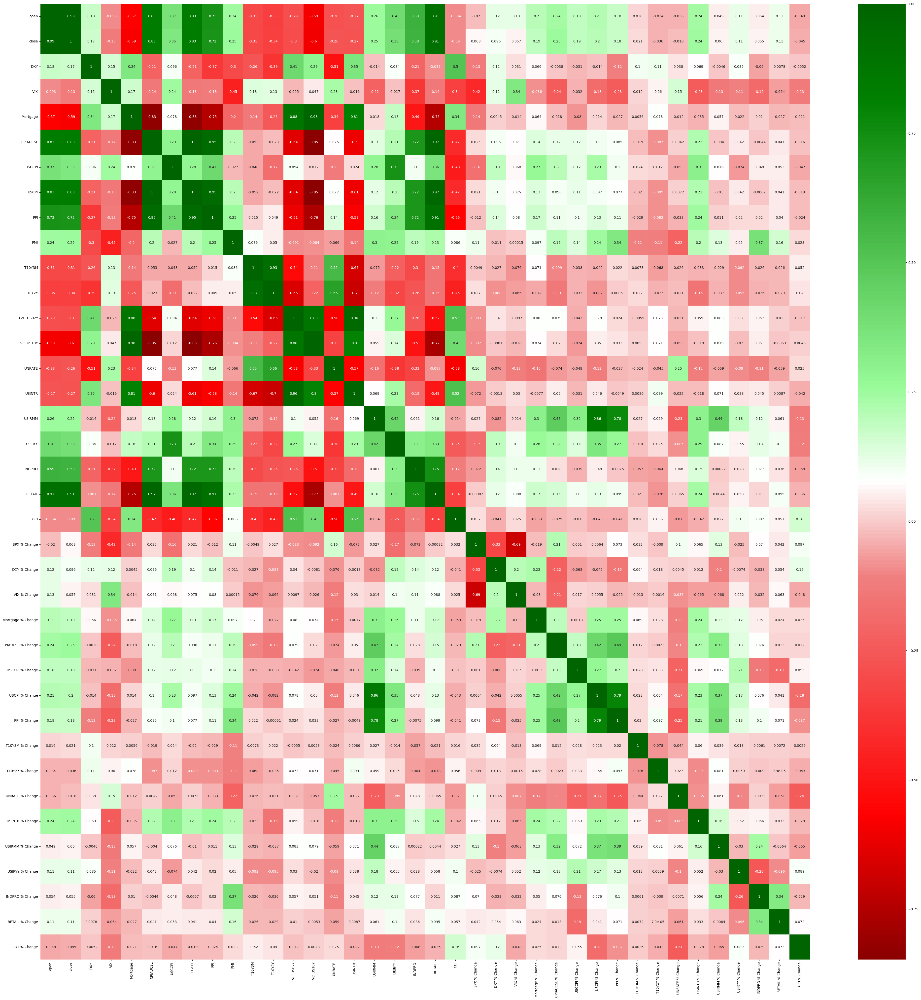

In [408]:
createHeatmap(whole,50)

>Logarithmic Analysis

In [409]:
def logDataFrame(dataframe):
    df = dataframe
    df = np.log(df)
    return df

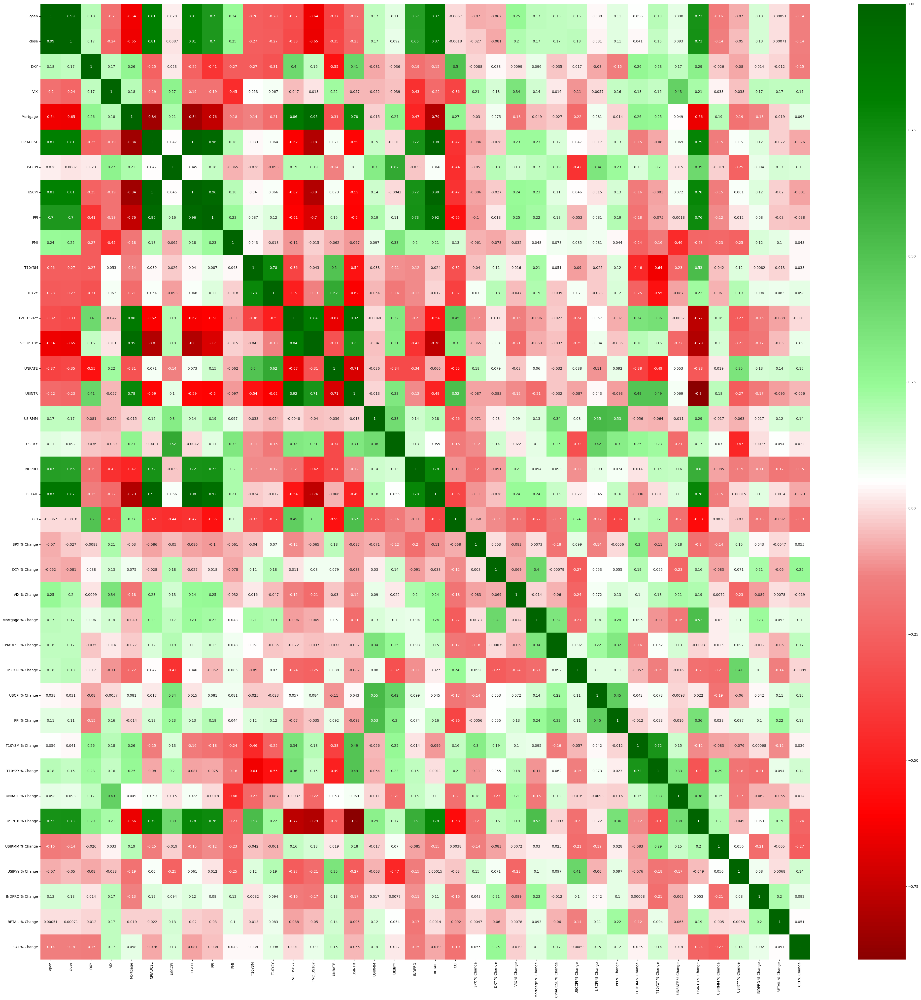

In [410]:
df_log = logDataFrame(whole)
createHeatmap(df_log,50)

Observation from logarithmic correlation heatmap:
1. SPX Close % Change and VIX = -0.69
2. SPX Close and Mortgage = -0.65
3. SPX Close and CPI(ISAICSL) = 0.81
4. SPX Close and PPI = 0.71
5. SPX Close and TVC_US10Y = -0.66
6. SPX Close and RETAIL = 0.87
7. SPX Close and USINTR % Change = -0.73

- Now that we have created a correlation matrix, let's plot specific data series.

> Dual Axis Plots

['time' 'open' 'close' 'DXY' 'VIX' 'Mortgage' 'CPIAUCSL' 'USCCPI' 'USCPI'
 'PPI' 'PMI' 'T10Y3M' 'T10Y2Y' 'TVC_US02Y' 'TVC_US10Y' 'UNRATE' 'USINTR'
 'USIRMM' 'USIRYY' 'INDPRO' 'RETAIL' 'CCI' 'SPX % Change' 'DXY % Change'
 'VIX % Change' 'Mortgage % Change' 'CPIAUCSL % Change' 'USCCPI % Change'
 'USCPI % Change' 'PPI % Change' 'T10Y3M % Change' 'T10Y2Y % Change'
 'UNRATE % Change' 'USINTR % Change' 'USIRMM % Change' 'USIRYY % Change'
 'INDPRO % Change' 'RETAIL % Change' 'CCI % Change']


<AxesSubplot:>

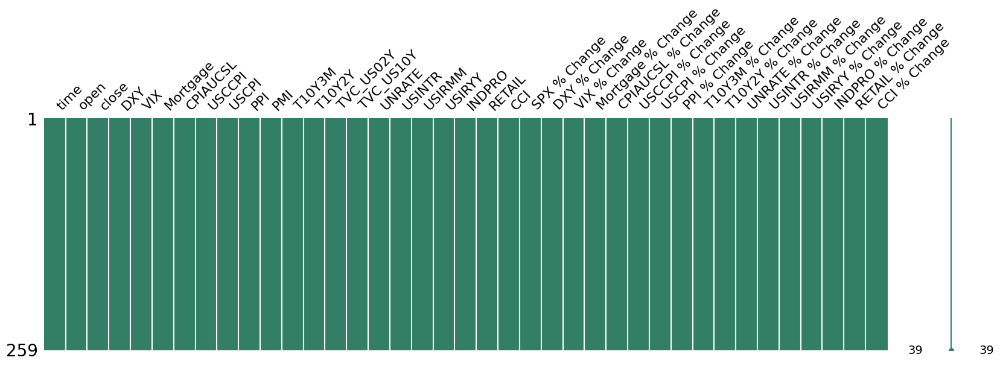

In [411]:
bigdata = pd.concat([df_all['time'],data, percentage_data], axis=1)
bigdata.replace([np.inf, -np.inf], np.nan, inplace=True)
bigdata.dropna(inplace=True)
print(bigdata.columns.values)
msno.matrix(df=bigdata.iloc[:, :], figsize=(20,5), color=(0.2, 0.5, 0.4))


In [412]:
def createDualAxisPlot(df1, df2, var1, var2):
    
    fig, ax = plt.subplots(1,1)
    color1 = random.choice(['r','b','purple','y','teal','brown','orange','gray'])
    color2 = random.choice(['r','b','purple','y','teal','brown','orange','gray'])
    bigdata.plot(x='time',y=df1, color=color1, ax=ax)
    ax.set_ylabel(var1, color=color1)

    ax2 = ax.twinx()
    bigdata.plot(x='time',y=df2, color=color2, ax=ax2)
    ax2.set_ylabel(var2, color=color2)
    ax.set_xlabel('Time')

    # adding grid and title
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.1)
    plt.title(var1 + ' and ' + var2)
    # adding vertical lines
    for xc in xposition:
        ax.axvline(x=xc, color='k', linestyle='dashed')
    plt.show()

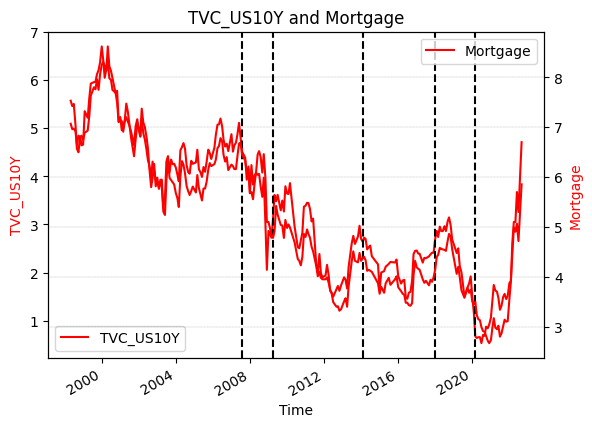

In [413]:
createDualAxisPlot('TVC_US10Y', 'Mortgage', 'TVC_US10Y', 'Mortgage')

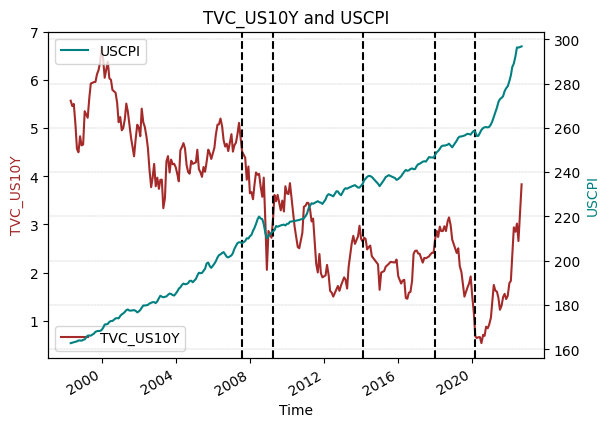

In [414]:
createDualAxisPlot('TVC_US10Y', 'USCPI', 'TVC_US10Y', 'USCPI')

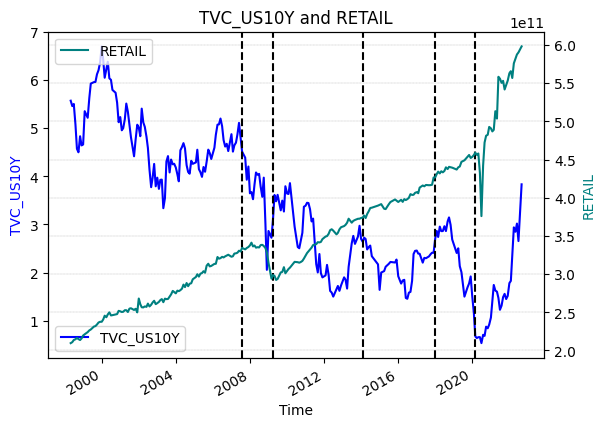

In [415]:
createDualAxisPlot('TVC_US10Y', 'RETAIL', 'TVC_US10Y', 'RETAIL')

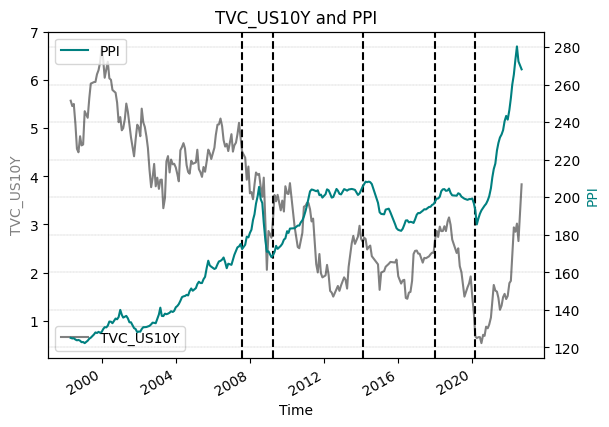

In [416]:
createDualAxisPlot('TVC_US10Y', 'PPI', 'TVC_US10Y', 'PPI')

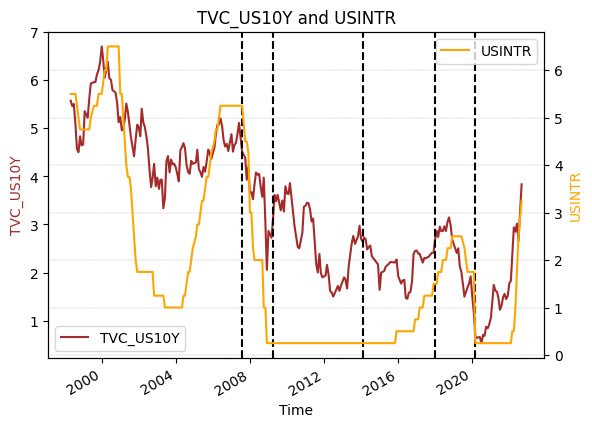

In [417]:
createDualAxisPlot('TVC_US10Y', 'USINTR', 'TVC_US10Y', 'USINTR')

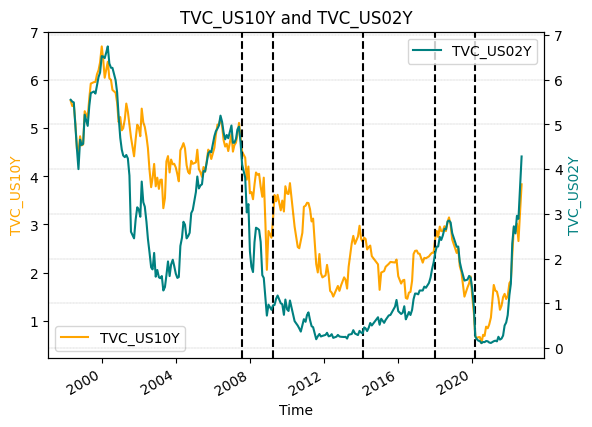

In [418]:
createDualAxisPlot('TVC_US10Y', 'TVC_US02Y', 'TVC_US10Y', 'TVC_US02Y')

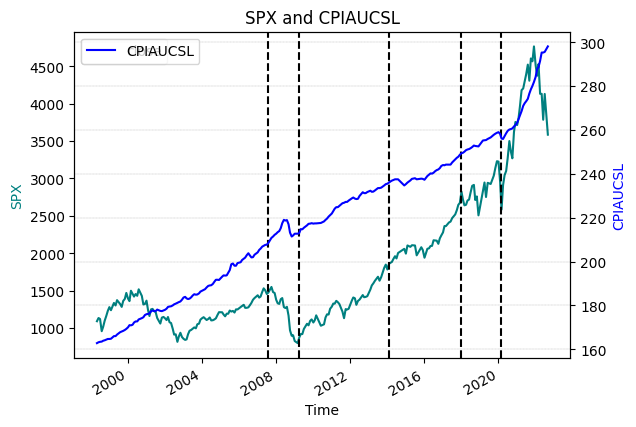

In [419]:
# corr =0.81
createDualAxisPlot('close','CPIAUCSL', 'SPX', 'CPIAUCSL')

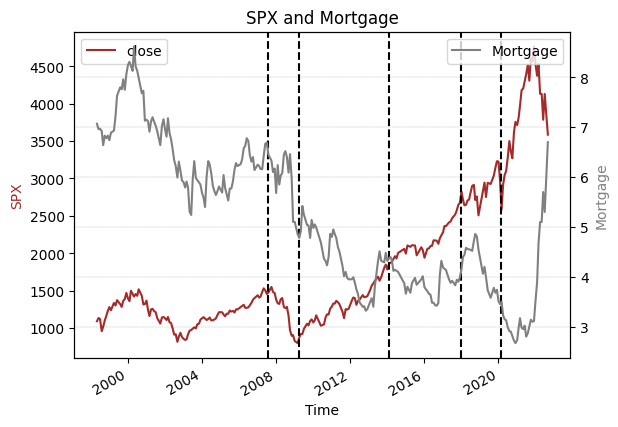

In [420]:
# corr = -0.65
createDualAxisPlot('close','Mortgage', 'SPX', 'Mortgage')

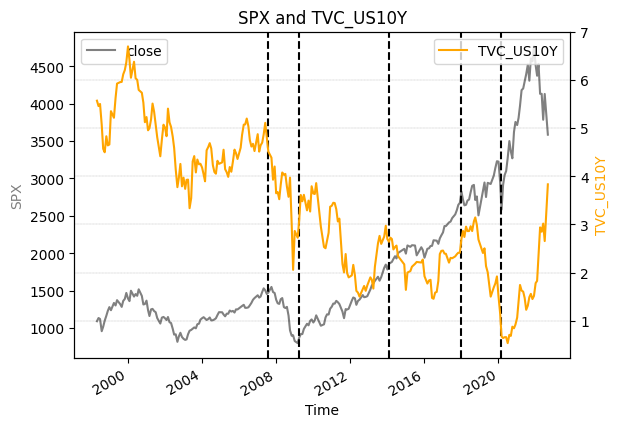

In [421]:
# corr = -0.66
createDualAxisPlot('close','TVC_US10Y', 'SPX', 'TVC_US10Y')

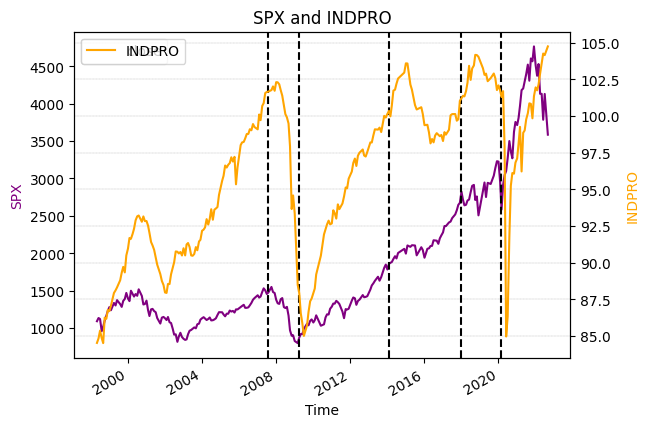

In [422]:
# corr = -0.66
createDualAxisPlot('close','INDPRO', 'SPX', 'INDPRO')

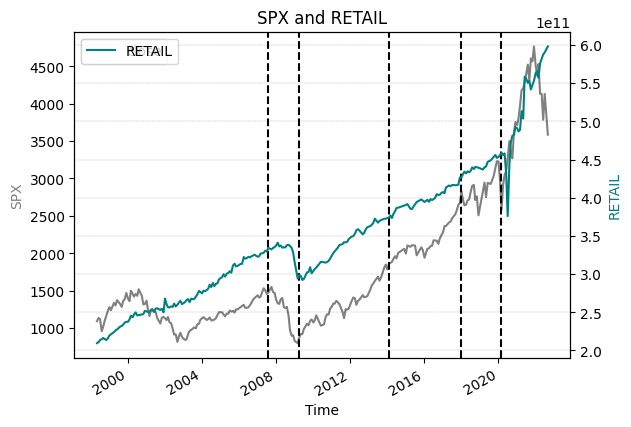

In [423]:
# corr = 0.87
createDualAxisPlot('close','RETAIL', 'SPX', 'RETAIL')

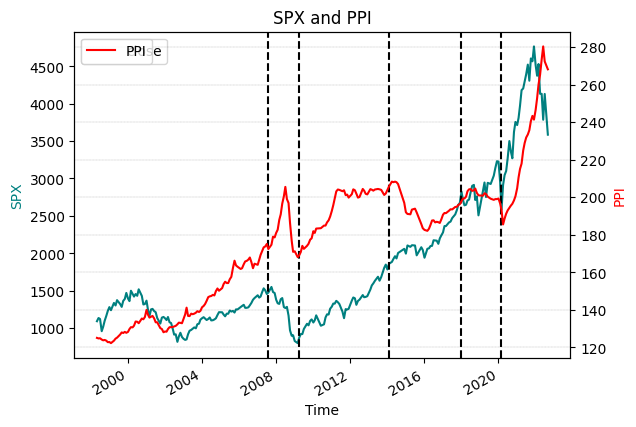

In [424]:
# corr = 0.71
createDualAxisPlot('close','PPI', 'SPX', 'PPI')

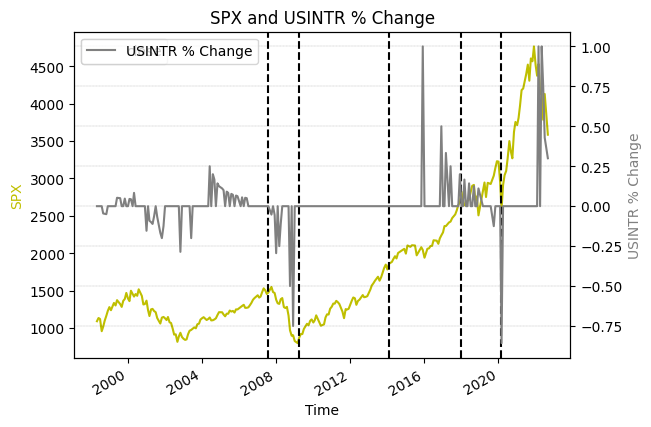

In [425]:
createDualAxisPlot('close', 'USINTR % Change', 'SPX', 'USINTR % Change')

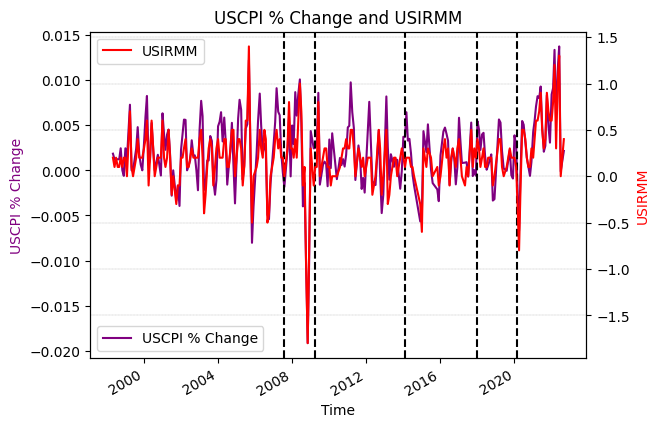

In [426]:
createDualAxisPlot('USCPI % Change', 'USIRMM', 'USCPI % Change', 'USIRMM')

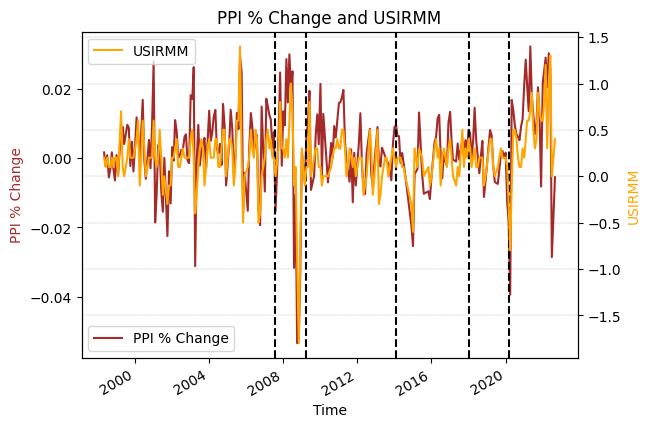

In [427]:
createDualAxisPlot('PPI % Change', 'USIRMM', 'PPI % Change', 'USIRMM')

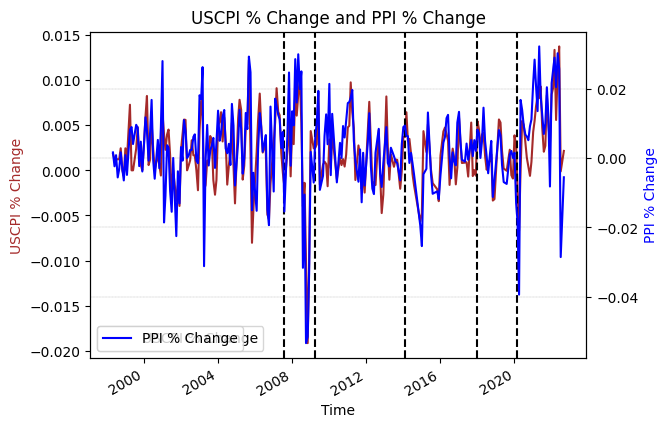

In [428]:
createDualAxisPlot('USCPI % Change', 'PPI % Change', 'USCPI % Change', 'PPI % Change')

3. Statistical Analysis

Scatter Matrix (Pearson Correlation)

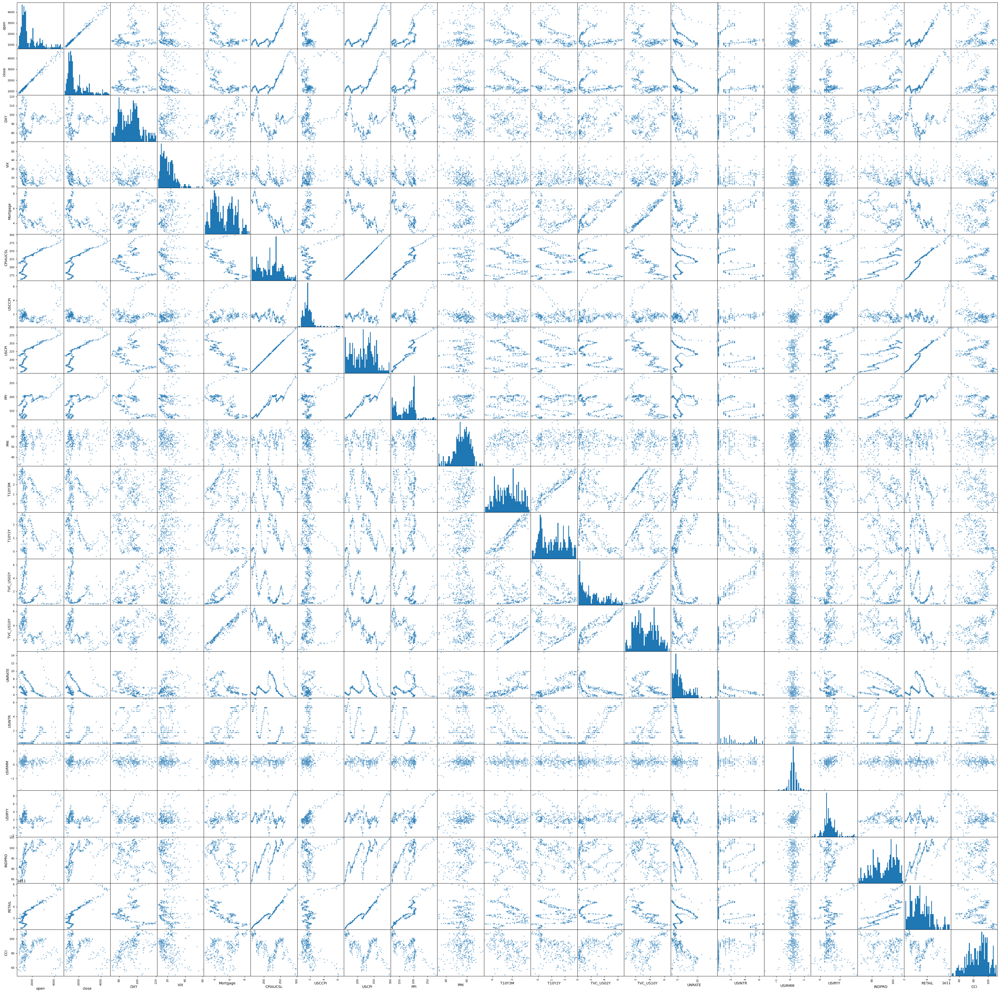

In [429]:
from pandas.plotting import scatter_matrix
scatter_matrix(data, figsize = (50,50), hist_kwds= {'bins':50})
plt.show()

- In multivariate statistics and probability theory, the scatter matrix is a statistic that is used to make estimates of the covariance matrix, for instance of the multivariate normal distribution.
- The above scatter matrix is the combination of histograms for each Dataframe and a subsequent scattered plot taking two Dataframes at a time. From the graph, we can clearly figure out that Unemployment Rate is loosely showing a linear correlation with 10yr Treasury Yield.

In [430]:
# sns.pairplot(data, kind='reg')

- This is similar to the scatter matrix shown above, but the jointplot draws a slopeline on scatterplots.

In [431]:
# sns.pairplot(df_log, kind='reg')

> Granger Causality test to see if the Treasury Yield is really leading the S&P 500.
- Grenger Causality assumes all the data are stationary by either cointegration or differencing transformations. #https://www.statology.org/granger-causality-test-in-python/#:~:text=The%20Granger%20Causality%20test%20is,is%20useful%20for%20forecasting%20another.&text=The%20term%20%E2%80%9CGranger%2Dcauses%E2%80%9D,at%20a%20later%20time%20period.

In [432]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests

In [433]:
# Set up a new slimmer dataframe for this purpose.

df_granger = bigdata[['time','close', 'TVC_US10Y']].copy()
df_granger.dropna(inplace=True)
df_granger.reset_index(drop=True, inplace=True)
df_granger.tail()


,time,close,TVC_US10Y
254,2022-04-01 08:30:00-05:00,4131.920,2.939
255,2022-05-02 08:30:00-05:00,4132.160,2.848
256,2022-06-01 08:30:00-05:00,3785.390,3.017
257,2022-07-01 08:30:00-05:00,4130.289,2.654
258,2022-09-01 08:30:00-05:00,3585.610,3.833


First we need to test each data series to make sure it is stationary using the Augmented Dickey Fuller test.

In [434]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,1].values  # SPX
result = adfuller(X)
print('[SPX]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,2].values  # TVC_US10Y
result = adfuller(X)
print('[TVC_US10Y]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


[SPX]
ADF Statistic: -0.314592
p-value: 0.923412
Critical Values:
	1%: -3.457
	5%: -2.873
	10%: -2.573
[TVC_US10Y]
ADF Statistic: -1.945360
p-value: 0.311032
Critical Values:
	1%: -3.456
	5%: -2.873
	10%: -2.573


• Treasury Yield proves to be stationary, but Price is not. It will need to be differenced.

In [435]:
df_granger['SPX % Change'] = bigdata['SPX % Change']
df_granger['SPX Diff'] = df_granger['close'].diff()
df_granger['SPX % Change Diff'] = df_granger['SPX % Change'].diff()
df_granger['TVC_US10Y % Change'] = bigdata['TVC_US10Y'].pct_change()
df_granger['TVC_US10Y Diff'] = df_granger['TVC_US10Y'].diff()
df_granger['TVC_US10Y % Change Diff'] = df_granger['TVC_US10Y % Change'].diff()
df_granger.dropna(inplace=True)
df_granger.head()


,time,close,TVC_US10Y,SPX % Change,SPX Diff,SPX % Change Diff,TVC_US10Y % Change,TVC_US10Y Diff,TVC_US10Y % Change Diff
6,1998-11-02 08:30:00-06:00,1163.63,4.832,-0.011615,64.96,-0.051054,0.008060,0.333,0.028164
7,1998-12-01 08:30:00-06:00,1229.23,4.642,-0.145574,65.60,-0.133958,-0.078139,-0.190,-0.086199
8,1999-01-01 08:30:00-06:00,1279.64,4.661,0.062160,50.41,0.207734,-0.098955,0.019,-0.020816
9,1999-02-01 08:30:00-06:00,1238.33,5.353,0.080252,-41.31,0.018092,-0.015751,0.692,0.083204
10,1999-04-01 08:30:00-06:00,1335.18,5.216,0.059126,96.85,-0.021126,0.074016,-0.137,0.089768


In [436]:
X = df_granger.iloc[:,3].values 
result = adfuller(X)
print('SPX % Change')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,4].values 
result = adfuller(X)
print('SPX Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,5].values  
result = adfuller(X)
print('SPX % Change Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,6].values  
result = adfuller(X)
print('TVC_US10Y % Change')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,7].values 
result = adfuller(X)
print('TVC_US10Y Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,8].values 
result = adfuller(X)
print('TVC_US10Y % Change Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value)) 

SPX % Change
ADF Statistic: -13.731496
p-value: 0.000000
Critical Values:
	1%: -3.465
	5%: -2.877
	10%: -2.575
SPX Diff
ADF Statistic: -3.959708
p-value: 0.001637
Critical Values:
	1%: -3.466
	5%: -2.877
	10%: -2.575
SPX % Change Diff
ADF Statistic: -10.420981
p-value: 0.000000
Critical Values:
	1%: -3.465
	5%: -2.877
	10%: -2.575
TVC_US10Y % Change
ADF Statistic: -11.301700
p-value: 0.000000
Critical Values:
	1%: -3.465
	5%: -2.877
	10%: -2.575
TVC_US10Y Diff
ADF Statistic: -13.400115
p-value: 0.000000
Critical Values:
	1%: -3.465
	5%: -2.877
	10%: -2.575
TVC_US10Y % Change Diff
ADF Statistic: -15.117514
p-value: 0.000000
Critical Values:
	1%: -3.465
	5%: -2.877
	10%: -2.575


The differenced data series are stationary.

Now, plot of the S&P Sales Pct Change series after differencing, to show what stationarity looks like.

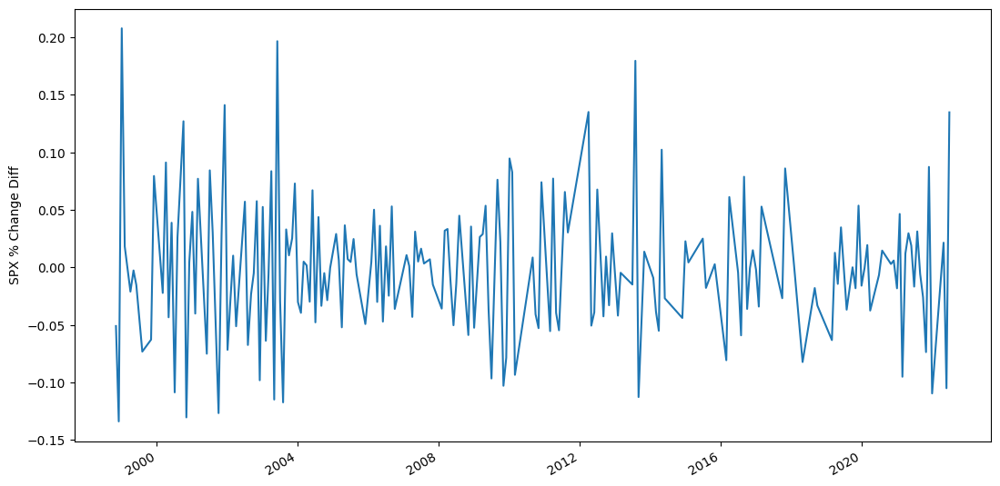

In [437]:
import matplotlib.dates as mdates

x = df_granger['time']
y = df_granger['SPX % Change Diff']

fig = plt.figure(figsize = (13,7))
ax = fig.add_subplot(111)
ax.set_ylabel('SPX % Change Diff')
ax.plot(x, y)

# format your data to desired format. 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# rotate and align the tick labels so they look better
fig.autofmt_xdate()

plt.show()

> Granger Causality Test
- between the TREASURY YIELD as the independent variable and the S&P PRICE % Change series as the dependent variable. <br>

This test uses the following null and alternative hypotheses:

Null Hypothesis (H0): Time series x does not Granger-cause time series y

Alternative Hypothesis (HA): Time series x Granger-causes time series y <br>

*"The F test statistic turns out to be 5.405 and the corresponding p-value is 0.0030. Since the p-value is less than .05, we can reject the null hypothesis of the test and conclude that knowing the number of eggs is useful for predicting the future number of chickens."*

In [438]:
gc_results = grangercausalitytests(df_granger[['SPX Diff', 'TVC_US10Y % Change Diff']], maxlag=5, verbose=True)

print(gc_results)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5010  , p=0.4799  , df_denom=191, df_num=1
ssr based chi2 test:   chi2=0.5088  , p=0.4756  , df=1
likelihood ratio test: chi2=0.5082  , p=0.4759  , df=1
parameter F test:         F=0.5010  , p=0.4799  , df_denom=191, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6552  , p=0.5205  , df_denom=188, df_num=2
ssr based chi2 test:   chi2=1.3452  , p=0.5104  , df=2
likelihood ratio test: chi2=1.3405  , p=0.5116  , df=2
parameter F test:         F=0.6552  , p=0.5205  , df_denom=188, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4252  , p=0.7352  , df_denom=185, df_num=3
ssr based chi2 test:   chi2=1.3238  , p=0.7235  , df=3
likelihood ratio test: chi2=1.3193  , p=0.7246  , df=3
parameter F test:         F=0.4252  , p=0.7352  , df_denom=185, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5155  , p=0.7244  

Now that we're pretty sure the CLI leads S&P Sales Changes, let's see if we can do further regression analysis to make some predictions.
First we will try to predict CLI values a few months out with the ARIMA autoregression model from the Statsmodels library, then use LinearRegression from Scikit Learn to predict S&P Sales changes from the predicted CLI values.

In [439]:
# date = bigdata[['time', 'TVC_US10Y']].copy()
# date['time'] = datetime.striptime(bigdata['time'], '%Y-%m-%d')
# X = date
# X.set_index(['time'], inplace=True)
# X.astype(float)
# X = X.dropna()

# X = X.loc['1998-01-01':]

# X = X.iloc[:, 0]
# #X.index = pd.to_datetime(X.index)

# X.tail()


The autocorrelation plot below indicates we can play with lagging the CLI up to 10 periods to get a decent fit.

In [440]:
# from pandas.plotting import autocorrelation_plot

# ax = autocorrelation_plot(X)
# ax.set_xlim([0, 30])

# plt.show()

The ARIMA residuals plots below indicate that we can optimize the fit with 1 lag period and 1 differencing operation. The idea is to get the residuals mean as close to zero as possible without overdoing it.

In [441]:
# from pandas import DataFrame
# from statsmodels.tsa.arima_model import ARIMA

# model = ARIMA(X, order=(1,1,0), freq='M')
# model_fit = model.fit(disp=0)
# print(model_fit.summary())
# # plot residual errors
# residuals = DataFrame(model_fit.resid)
# residuals.plot()
# plt.show()
# residuals.plot(kind='kde')
# plt.show()
# print(residuals.describe())


*** 
## 4. Machine Learning - Linear Regression
- if I'm going to do modeling, what model am I trying to build? 
    - linear regression model after generating mathmatical algorithm
- What am i trying to get out of this?
    - predict stock price based on cpi movement. 
- fit the data into the model and forecast for three months out.

Predicting stock prices is an enigmatic task pursued by many. Spot-on accuracy may not be practical but sometimes even simple linear models can be surprisingly close.

보통 train, test 만 언급되지만, 실제 좋은 모델을 만들기 위해서 우리는 valid set을 따로 만들어 모델 평가를 해봅니다.

마치 축구대표팀이 팀훈련(train)을 하고 바로 월드컵(test)로 나가는 것이 아니라, 팀훈련(train)을 한 다음 평가전(valid)를 거쳐 팀의 훈련 정도(학습정도)를 확인하고 월드컵(test)에 나가는 것과 비슷합니다.

train_test_split 을 사용하여 쉽게 train 셋을 분리할 수 있습니다.

In [448]:
# Split data into testing and training sets: 8:2 split
X = df_granger['SPX Diff'].values.reshape(-1,1)
y = df_granger['TVC_US10Y % Change Diff'].values.reshape(-1,1)
X_tr, X_vld, y_tr, y_vld = train_test_split(X, y, test_size=0.2, random_state=0)

# # Test set
# print(X_vld.describe())

# # Training set
# print(X_tr.describe())

# # y Test set
# print(y_vld.describe())

# # y Training set
# print(y_tr.describe())


model = LinearRegression()
model.fit(X_tr, y_tr)
model_prediction = model.predict(X_vld)

# Printout relevant metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
print("Model Coefficients:", model.coef_)
print("Mean Absolute Error:", mean_absolute_error(y_vld, model_prediction))
print("Coefficient of Determination:", r2_score(y_vld, model_prediction))

print('Conclusively, Out of {} Price Moves, {:.2f}% Accuracy to predict the price accurately'.format(y_vld.shape[0], r2_score(y_vld, model_prediction)*100 ))

Model Coefficients: [[0.00018434]]
Mean Absolute Error: 0.09925134826176547
Coefficient of Determination: 0.05337913721453458
Conclusively, Out of 39 Price Moves, 5.34% Accuracy to predict the price accurately


The prediction model proves to have 81% accuracy in average. It is evidently proven that there is a clear linear relationship between CPI and S&P index movement.

***
## 5. Hypothesis testing - Will the market go down in 2023?
- Apply LinearRegression model that we just trained and analyze the results.
- Record the result